In [72]:
from visualization_fct import *
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.preprocessing import scale

# from bokeh.plotting import output_file, show, save
# from bokeh.mpl import to_bokeh

from bokeh.resources import CDN
from bokeh.embed import file_html
from bokeh.plotting import output_notebook, show, output_file
output_notebook()

import matplotlib.pyplot as plt  # , mpld3
import pyfits


np.random.seed(0)

# for now, no ratio in data (no rates A, B or C in this dataset)

only_flux = True
scale_flux = True

hdulist = pyfits.open('../iirc_data/all_data_for_ml.fits')
data = hdulist[1].data

X_flux, X, data_thr, data_fr_en = get_iirc_data(
    data, only_flux=only_flux, scale_flux=scale_flux, thresholded=True)[:4]

# labels from gamma as in the paper:
a = np.array(data_thr['gamma'])
y = (a > 2.5).astype('int') + (a > 2).astype('int')


Loading BokehJS ...

In [73]:
data_thr.columns
X_flux.shape

(1947, 78)

<IPython.core.display.Javascript object>


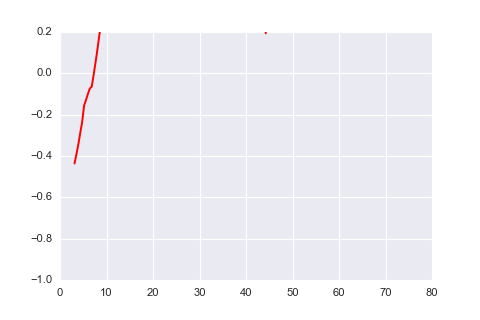

In [74]:
# make video / widget of showing spectra over time
import matplotlib.animation as animation

En = np.concatenate([np.array(data_fr_en[name]).reshape(-1, 1) for name in data_fr_en.columns], axis=1)
colors = ['red', 'blue', 'green']

#%matplotlib auto  #  'osx', 'qt4', 'qt5', 'gtk3', 'wx', 'qt', 'gtk', 'tk'

fig, ax = plt.subplots()

#line, = ax.plot(En[0, :], X_flux[0, :])
line, = ax.plot(range(X_flux.shape[1]), X_flux[0, :])

def animate(i):
    # line.set_xdata(En[i, :])  # update the data
    line.set_ydata(X_flux[i, :])   # update the data
    line.set_color(colors[y[i]])
    return line,


## Init only required for blitting to give a clean slate.
#def init():
#    line.set_ydata(np.ma.array(x, mask=True))
#    return line,

ani = animation.FuncAnimation(fig, animate, np.arange(1, 2000), #init_func=init,
                              interval=25, blit=True)
plt.show()


#ani.save('spectra_over_time.mp4', writer = 'mencoder', fps=30, extra_args=['-vcodec', 'libx264'])

<IPython.core.display.Javascript object>


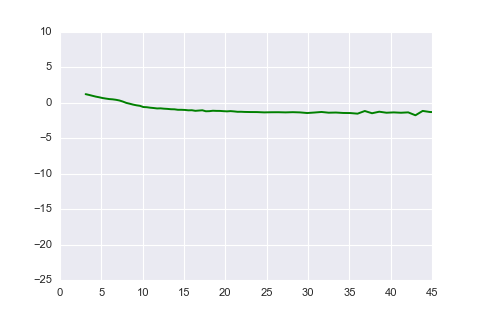

In [75]:
# visualize datapoints by plotting spectrum multiplied by energy (en_hi + en_lo)/2

fig, ax = plt.subplots()
#plt.axes(xlim=(0, 1e-6), ylim=(0, 80))

line, = ax.plot(En[0, :], X_flux[0, :] * En[0, :])
#line, = ax.plot(range(X_flux.shape[1]), X_flux[0, :] * En[0, :])

def animate(i):
    line.set_xdata(En[i, :])  # update the data
    line.set_ydata(X_flux[i, :] * En[i, :])   # update the data
    line.set_color(colors[y[i]])
    return line,


# Init only required for blitting to give a clean slate.
def init():
    line.set_xdata(En[0, :])
    line.set_ydata(X_flux[0, :] * En[0, :])
    line.set_color(colors[y[0]])
    return line,

ani = animation.FuncAnimation(fig, animate, np.arange(1, 2000), init_func=init,
                              interval=250, blit=True)
plt.show()

<IPython.core.display.Javascript object>


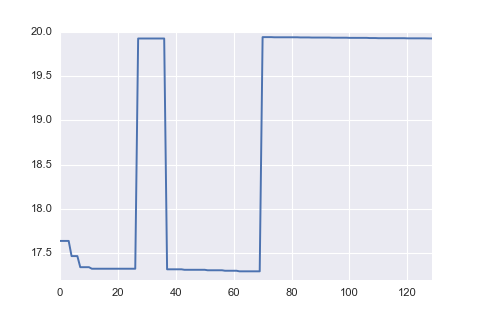

In [87]:
#plt.matshow(En, cmap='viridis')
plt.figure()
plt.plot(En[:, 40])
plt.show()

In [40]:
lda = LDA(n_components=2).fit(X, y)
preds = lda.predict(X)
X_lda = lda.transform(X)
X_lda

array([[-1.70627765,  0.90553201],
       [-2.1755152 ,  0.65845978],
       [-1.570544  ,  0.38977556],
       ..., 
       [ 8.09783886,  1.56227095],
       [ 8.72105937,  2.28707857],
       [ 8.31739839,  1.65554049]])

In [33]:
lda = LDA(n_components=2).fit(X_flux, y)
preds = lda.predict(X_flux)
X_lda = lda.transform(X_flux)
X_lda

array([[-1.58658056, -0.09451231],
       [-1.83840254, -0.00896516],
       [-1.60037007, -0.01951903],
       ..., 
       [ 7.705853  ,  1.58098794],
       [ 7.8472169 ,  1.76587232],
       [ 7.40069462,  1.71674549]])

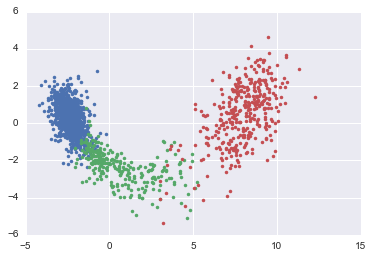

In [34]:
%matplotlib inline
clr = np.array(['blue', 'red', 'yellow'])
for j in range(3):
    plt.plot(X_lda[:, 0][y==j], X_lda[:, 1][y==j], '.')
plt.show()

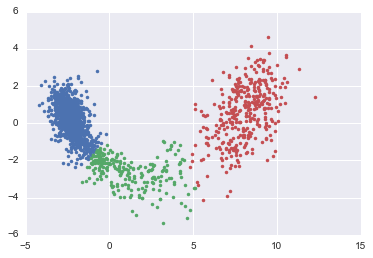

In [35]:
for j in range(3):
    plt.plot(X_lda[:, 0][preds==j], X_lda[:, 1][preds==j], '.')
plt.show()

In [36]:
lda.explained_variance_ratio_

array([ 0.9467502,  0.0532498])

<IPython.core.display.Javascript object>


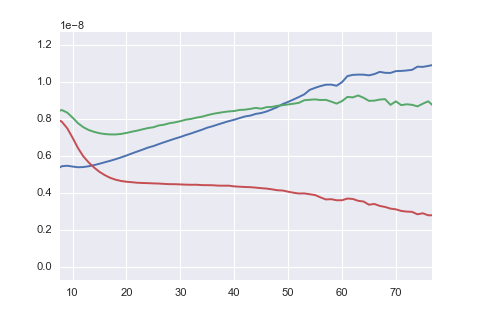

In [41]:
%matplotlib notebook
plt.figure()
plt.plot(lda.means_.T)
#plt.ylim([-1e-9,2e-8])
plt.show()

<IPython.core.display.Javascript object>


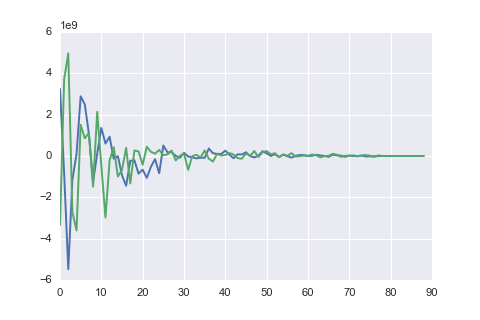

In [42]:
%matplotlib notebook
plt.figure()
plt.plot(lda.scalings_)
plt.show()

<IPython.core.display.Javascript object>


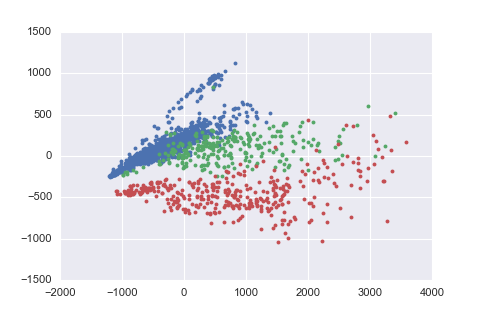

In [43]:
#try with X_flux instead of X
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit(X).transform(X)
%matplotlib notebook
plt.figure()
for j in range(3):
    plt.plot(X_pca[:, 0][y==j], X_pca[:, 1][y==j], '.')
plt.show()

In [12]:
pca.explained_variance_ratio_

array([ 0.88712959,  0.11061042])

<IPython.core.display.Javascript object>


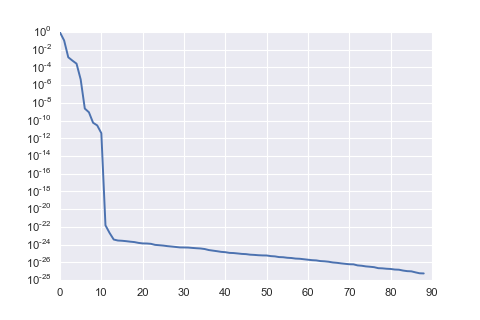

('pca.explained_variance_ratio_', array([  8.87129590e-01,   1.10610419e-01,   1.39861921e-03,
         5.90475461e-04,   2.66434965e-04,   4.45795088e-06,
         2.27023032e-09,   8.59966503e-10,   5.68384279e-11,
         2.85061985e-11,   3.75474720e-12,   1.48907006e-22,
         2.03291684e-23,   3.70435107e-24,   2.86920564e-24,
         2.69102402e-24,   2.42213205e-24,   2.12559720e-24,
         1.90765803e-24,   1.54685588e-24,   1.35274295e-24,
         1.32146711e-24,   1.21498480e-24,   9.27859985e-25,
         8.47209843e-25,   7.66582533e-25,   6.64085332e-25,
         5.98124100e-25,   5.36470712e-25,   4.78217493e-25,
         4.70251709e-25,   4.60641941e-25,   4.18940850e-25,
         3.86689465e-25,   3.61913575e-25,   3.14586245e-25,
         2.41009231e-25,   2.06749947e-25,   1.78051023e-25,
         1.50500818e-25,   1.38240910e-25,   1.15242386e-25,
         1.10238549e-25,   9.91401294e-26,   8.82950031e-26,
         8.34454459e-26,   7.25605431e-26,   6.8353

In [44]:
from sklearn.decomposition import PCA
pca = PCA(n_components=None)
X_pca = pca.fit(X).transform(X)
plt.figure()
print('pca.explained_variance_ratio_', pca.explained_variance_ratio_)
#df = pd.DataFrame(X_pca, columns=['1','2','3'])
#df['y'] = pd.Series(y).astype("category")
#scatter_matrix_seaborn(df, y='y', size=3)
#plt.plot(pca.explained_variance_ratio_)
plt.semilogy(pca.explained_variance_ratio_)
plt.show()

<IPython.core.display.Javascript object>


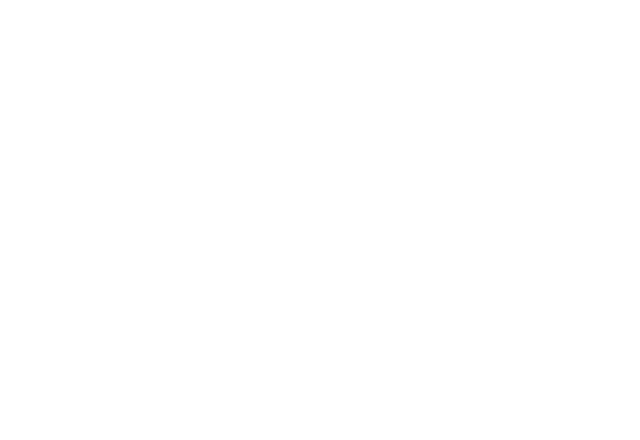

In [14]:
#pca.components_
plt.figure()
plt.plot(pca.components_[:3].T)
plt.show()

In [15]:
#nmf:

from sklearn.decomposition import NMF
Xpos = X - X.min(axis=0)
model = NMF(n_components=2, init='random', random_state=0)
model.fit(Xpos) 
X_nmf = model.transform(Xpos)
for j in range(3):
    plt.plot(X_nmf[:, 0][y==j], X_pca[:, 1][y==j], '.')
plt.show()
print 'model.reconstruction_err_', model.reconstruction_err_
#print 'model.components_', model.components_

model.reconstruction_err_ 12255.7742154


<IPython.core.display.Javascript object>


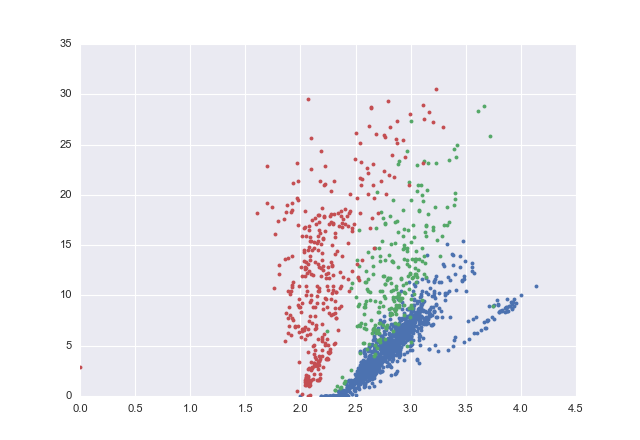

In [16]:
model = NMF(n_components=2, init='random', random_state=0)
%matplotlib notebook
plt.figure()
model.fit(Xpos)
X_nmf = model.transform(Xpos)
for j in range(3):
    plt.plot(X_nmf[:, 0][preds==j], X_nmf[:, 1][preds==j], '.')#, c='k')
plt.show()

<IPython.core.display.Javascript object>


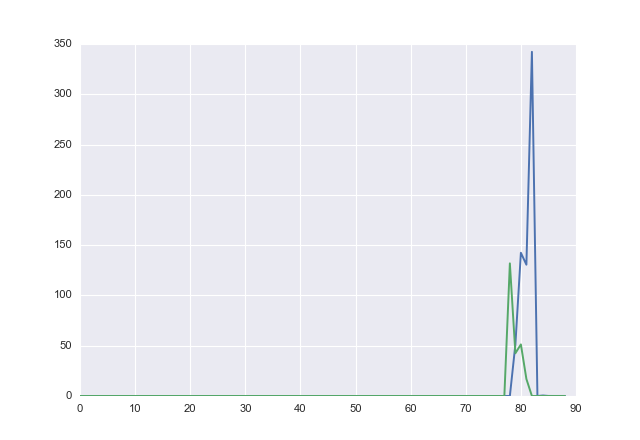

In [17]:
plt.figure()
plt.plot(model.components_.T)
plt.show()

<IPython.core.display.Javascript object>


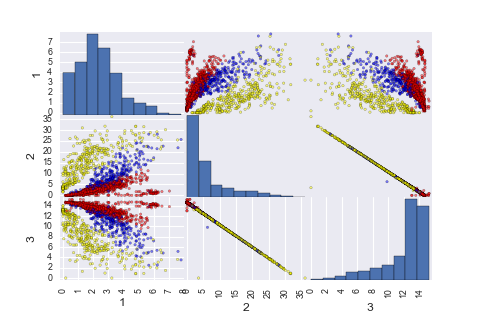

model.reconstruction_err_ 1678.13174904


In [48]:
model = NMF(n_components=3, init='random', random_state=0)
model.fit(Xpos)

colors = ['red', 'blue', 'yellow']

X_nmf = model.transform(Xpos)
df = pd.DataFrame(X_nmf, columns=['1','2', '3'])
df['y'] = pd.Series(y).astype("category")
#scatter_matrix_seaborn(df, y='y', size=3)

from pandas.tools.plotting import scatter_matrix
col = [colors[x] for x in df['y']]
scatter_matrix(df, c=col)#, alpha=0.2, figsize=(6, 6), diagonal='kde')


print 'model.reconstruction_err_', model.reconstruction_err_
#print 'model.components_', model.components_

In [49]:
model.components_.shape

(3, 89)

<IPython.core.display.Javascript object>


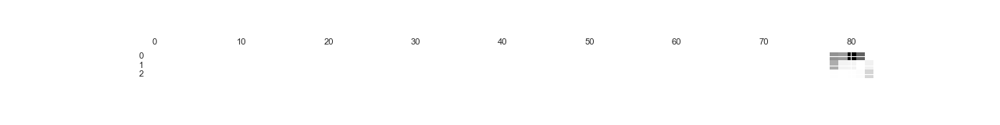

In [50]:
plt.matshow(model.components_)

<IPython.core.display.Javascript object>


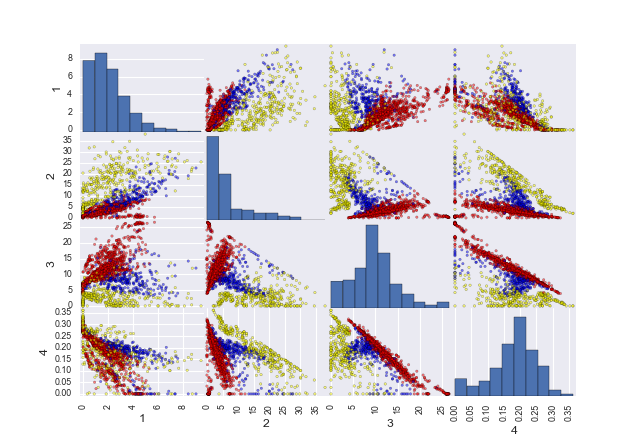

model.reconstruction_err_ 755.091188001


In [19]:
model = NMF(n_components=4, init='random', random_state=0)
model.fit(Xpos) 
X_nmf = model.transform(Xpos)
df = pd.DataFrame(X_nmf, columns=['1','2', '3', '4'])
df['y'] = pd.Series(y).astype("category")

from pandas.tools.plotting import scatter_matrix
col = [colors[x] for x in df['y']]
scatter_matrix(df, c=col)#, alpha=0.2, figsize=(6, 6), diagonal='kde')

#scatter_matrix_seaborn(df, y='y', size=3)
print 'model.reconstruction_err_', model.reconstruction_err_
#print 'model.components_', model.components_

<IPython.core.display.Javascript object>


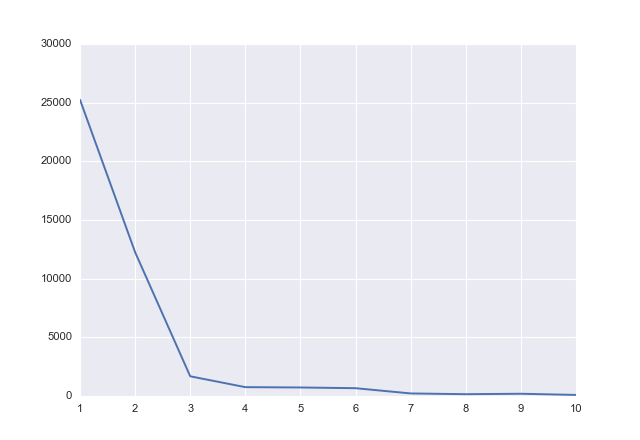

In [20]:
err = []
n_comps = range(1, 11)
for n_comp in n_comps:
    model = NMF(n_components=n_comp, init='random', random_state=0)
    model.fit(Xpos) 
    err += [model.reconstruction_err_]
plt.figure()
plt.plot(n_comps, err)

In [21]:
df

,1,2,3,4,y
0,2.917323,0.788424,21.012153,0.069355,0
1,2.836403,0.531935,21.037022,0.071382,0
2,2.348716,0.340894,19.301776,0.098080,0
3,1.787698,0.151849,17.458444,0.126164,0
4,2.670562,0.487893,24.439581,0.023028,0
5,2.766124,0.554492,25.148816,0.012304,0
6,2.318360,0.380860,22.134014,0.057078,0
7,5.711187,0.304092,26.489010,0.000000,0
8,5.122900,0.628336,26.159674,0.000000,0
9,4.704459,0.768704,25.963670,0.000000,0


In [22]:
p = bokeh_plot_cov(data_thr, x_name='5', y_name='0',
                   pred_name='y',
                   title=None,
                   plot_width=900, plot_height=300)
show(p)